In [125]:
import json
import matplotlib.pyplot as plt

with open("moves.json", "r") as file:
    data = json.load(file)

unique_data = {}

for key, value in data.items():
    original_list = value
    unique_list = [original_list[0]]

    for num in original_list[1:]:
        if num != unique_list[-1]:
            unique_list.append(num)

    # Removing elements between repeated numbers
    final_list = [unique_list[0]]
    for i in range(1, len(unique_list) - 1):
        if unique_list[i] not in unique_list[i + 1:]:
            final_list.append(unique_list[i])
    final_list.append(unique_list[-1])

    unique_data[key] = final_list

data = unique_data
print(data)
print(len(data))

{'h728c1:0_0': ['-43', '-27', '-3', '11', '23', '31'], 'h3270c1:0_0': ['-31', '-23', '-11', '3', '27', '45'], 'h854c1:0_0': ['-15', '11', '23'], 'h2295c1:0_0': ['-152', '144', '-15', '3', '-71', '202', '334', '-334'], 'h1148c1:0_0': ['-144', '152', '-162', '120'], 'h134c1:0_0': ['219', '75', '-64'], 'h479c1:0_0': ['-60', '-31', '-23', '-11', '3', '-71', '202'], 'h307c1:0_0': ['92', '-190', '-172', '164', '-152', '148'], 'h2394c1:0_0': ['27', '55', '71', '-3', '15', '-144', '152', '-164'], 'h786c1:0_0': ['58', '-23'], 'h1815c1:0_0': ['334', '-334', '-202', '71', '-3', '15', '-144', '152', '-162'], 'h1451c1:0_0': ['-334', '-202', '71', '-3', '11', '109'], 'h798c1:0_0': ['-23', '-11', '3', '27', '43', '199'], 'h265c1:0_0': ['190', '219', '79', '-79', '92'], 'h1600c1:0_0': ['162', '-152', '-131', '-109', '23'], 'h2671c1:0_0': ['-199', '-43', '-27', '-3', '11', '109', '123'], 'h1010c1:0_0': ['-148', '152', '-162', '120'], 'h798c1:0_1': ['199', '-202', '71', '-3', '11', '23', '37', '-31', '-

In [126]:
# Create a new dictionary to store the filtered and expanded data
filtered_data = {}

# Iterate over each key-value pair in the dictionary
for key, value_list in data.items():
    if len(value_list) >= 6:
        # Create sliding windows of length 6
        for i in range(len(value_list) - 5):
            new_key = f"{key}_{i}"  # Adjust the key to include index
            new_value = value_list[i:i+6]
            filtered_data[new_key] = new_value
    else:
        # Remove entries with length less than 6
        pass

data = filtered_data
print(data)
print(len(data))

{'h728c1:0_0_0': ['-43', '-27', '-3', '11', '23', '31'], 'h3270c1:0_0_0': ['-31', '-23', '-11', '3', '27', '45'], 'h2295c1:0_0_0': ['-152', '144', '-15', '3', '-71', '202'], 'h2295c1:0_0_1': ['144', '-15', '3', '-71', '202', '334'], 'h2295c1:0_0_2': ['-15', '3', '-71', '202', '334', '-334'], 'h479c1:0_0_0': ['-60', '-31', '-23', '-11', '3', '-71'], 'h479c1:0_0_1': ['-31', '-23', '-11', '3', '-71', '202'], 'h307c1:0_0_0': ['92', '-190', '-172', '164', '-152', '148'], 'h2394c1:0_0_0': ['27', '55', '71', '-3', '15', '-144'], 'h2394c1:0_0_1': ['55', '71', '-3', '15', '-144', '152'], 'h2394c1:0_0_2': ['71', '-3', '15', '-144', '152', '-164'], 'h1815c1:0_0_0': ['334', '-334', '-202', '71', '-3', '15'], 'h1815c1:0_0_1': ['-334', '-202', '71', '-3', '15', '-144'], 'h1815c1:0_0_2': ['-202', '71', '-3', '15', '-144', '152'], 'h1815c1:0_0_3': ['71', '-3', '15', '-144', '152', '-162'], 'h1451c1:0_0_0': ['-334', '-202', '71', '-3', '11', '109'], 'h798c1:0_0_0': ['-23', '-11', '3', '27', '43', '199'

In [127]:
unique_numbers = set()

for value_list in data.values():
    for item in value_list:
        unique_numbers.add(int(item))

unique_numbers = list(unique_numbers)
print(unique_numbers)

[3, 131, -123, 5, -120, 11, 15, 144, -109, 148, 23, 152, 27, -229, 31, 162, 164, 37, 43, 172, 45, -338, -79, -334, -206, -75, -202, 55, 184, -71, -199, 58, 60, -196, 190, 64, -64, -190, -60, 68, 196, 71, 199, -184, 202, 75, -55, 334, 79, 338, -172, -43, 219, 92, -164, -162, -31, -27, 229, -152, -23, -148, 109, -131, -144, -15, -11, 120, 123, -3]


In [128]:
import numpy as np
# Initialize a dictionary to store updated values
updated_data = {}

# Iterate through unique_data
for key, value_list in data.items():
    # Create a list to store the numerical representation of numbers in the original list
    numerical_list = [0] * len(unique_numbers)
    
    # Iterate through each number in the value list
    for item in value_list:
        # Check if the number is in unique_numbers_list
        if int(item) in unique_numbers:
            # If it is, get its index in unique_numbers_list
            index = unique_numbers.index(int(item))
            # Increment the value by 1 and update the corresponding index in numerical_list
            numerical_list[index] = value_list.index(item) + 1
    
    # Update the value in updated_data
    updated_data[key] = numerical_list

# Print updated_data
print(unique_numbers)
data = updated_data
for key, value in data.items():
    print(key, ":", value)

[3, 131, -123, 5, -120, 11, 15, 144, -109, 148, 23, 152, 27, -229, 31, 162, 164, 37, 43, 172, 45, -338, -79, -334, -206, -75, -202, 55, 184, -71, -199, 58, 60, -196, 190, 64, -64, -190, -60, 68, 196, 71, 199, -184, 202, 75, -55, 334, 79, 338, -172, -43, 219, 92, -164, -162, -31, -27, 229, -152, -23, -148, 109, -131, -144, -15, -11, 120, 123, -3]
h728c1:0_0_0 : [0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 5, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3]
h3270c1:0_0_0 : [4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 3, 0, 0, 0]
h2295c1:0_0_0 : [4, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,

In [129]:
def replace_row_with_zeros(matrix, row_index, keep_value):
    if row_index < 0 or row_index >= len(matrix):
        print("Invalid row index")
        return

    row = matrix[row_index]
    for i in range(len(row)):
        if row[i] != keep_value:
            row[i] = 0

def replace_non_zeros_with_one(matrix):
    for row_index, row in enumerate(matrix):
        for col_index, value in enumerate(row):
            if value != 0:
                matrix[row_index][col_index] = 1

In [130]:
for key, value in data.items():
    new_value=[]
    for i in range(0,6):
        new_value.append(value.copy())
    for i in range(0,6):
        replace_row_with_zeros(new_value, i, i+1)
    replace_non_zeros_with_one(new_value)
    data[key] = new_value
    print(key, ":", data[key])

h728c1:0_0_0 : [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [131]:
import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import pandas as pd
import random
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split
from torch import nn
import torch.nn.functional as F
import torch.optim as optim

data_dir = 'dataset'

data_tensor = torch.tensor([value for value in data.values()], dtype=torch.float32)

train_dataset = data_tensor.unsqueeze(1)
#test_dataset  = torchvision.datasets.MNIST(data_dir, train=False, download=True)

train_transform = transforms.Compose([
transforms.ToTensor(),
])

test_transform = transforms.Compose([
transforms.ToTensor(),
])

train_dataset.transform = train_transform
#test_dataset.transform = test_transform

m=len(train_dataset)

train_data, val_data = random_split(train_dataset, [int(m-m*0.2), int(m*0.2)])
batch_size=256

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size)
#test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,shuffle=True)

In [132]:
class Encoder(nn.Module):

    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()

        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            nn.ReLU(True),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ReLU(True)
        )

        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)
### Linear section
        self.encoder_lin = nn.Sequential(
            nn.Linear(3 * 3 * 32, 128),
            nn.ReLU(True),
            nn.Linear(128, encoded_space_dim)
        )

    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        return x
class Decoder(nn.Module):

    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            nn.Linear(encoded_space_dim, 128),
            nn.ReLU(True),
            nn.Linear(128, 3 * 3 * 32),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1,
        unflattened_size=(32, 3, 3))

        self.decoder_conv = nn.Sequential(
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
        )

    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [133]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr= 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
d = 4

#model = Autoencoder(encoded_space_dim=encoded_space_dim)
encoder = Encoder(encoded_space_dim=d,fc2_input_dim=128)
decoder = Decoder(encoded_space_dim=d,fc2_input_dim=128)
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

Selected device: cuda


Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=4, out_features=128, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=128, out_features=288, bias=True)
    (3): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (4): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

In [134]:
### Training function
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        print(image_batch)
        # Encode data
        encoded_data = encoder(image_batch)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        print('\t partial train loss (single batch): %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [135]:
### Testing function
def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label)
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [136]:
data_dir = 'dataset'

train_dataset_MNIST = torchvision.datasets.MNIST(data_dir, train=True, download=True)

train_transform_MNIST = transforms.Compose([
transforms.ToTensor(),
])

train_dataset_MNIST.transform = train_transform_MNIST

m=len(train_dataset_MNIST)

train_data_MNIST, val_data = random_split(train_dataset_MNIST, [int(m-m*0.2), int(m*0.2)])
batch_size=256

train_loader_MNIST = torch.utils.data.DataLoader(train_data_MNIST, batch_size=batch_size)

In [137]:
import torch

# Assuming train_loader is your DataLoader

# Iterate over the DataLoader to get a batch of data
for batch in train_loader:
    # Assuming each batch contains input data and labels
    data = batch
    
    # Print the shape of the input data
    print("Shape of data:", data.shape)
    
    # Optionally, you can print a sample of the data
    print("Sample data:", data[0])
    
    # Break after the first batch to avoid printing too much
    break

Shape of data: torch.Size([256, 1, 6, 70])
Sample data: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 1., 0., 0., 0.

In [138]:
import torch

# Assuming train_loader is your DataLoader

# Iterate over the DataLoader to get a batch of data
for batch in train_loader_MNIST:
    # Assuming each batch contains input data and labels
    data, labels = batch
    
    # Print the shape of the input data
    print("Shape of data:", data.shape)
    # Print the shape of the labels
    print("Shape of labels:", labels.shape)
    
    # Optionally, you can print a sample of the data
    print("Sample data:", data[0])
    # Optionally, you can print a sample of the labels
    print("Sample label:", labels[0])
    
    # Break after the first batch to avoid printing too much
    break

Shape of data: torch.Size([256, 1, 28, 28])
Shape of labels: torch.Size([256])
Sample data: tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.000

# plot_ae_outputs
def plot_ae_outputs(encoder,decoder,n=10):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(n):
      ax = plt.subplot(2,n,i+1)
      img = test_dataset[t_idx[i]][0].unsqueeze(0).to(device)
      encoder.eval()
      decoder.eval()
      with torch.no_grad():
         rec_img  = decoder(encoder(img))
      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()

In [139]:
num_epochs = 30
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
   train_loss = train_epoch(encoder,decoder,device, train_loader,loss_fn,optim)
   print('\n EPOCH {}/{} \t train loss {}'.format(epoch + 1, num_epochs,train_loss))
   #val_loss = test_epoch(encoder,decoder,device,test_loader,loss_fn)
   #print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   #diz_loss['train_loss'].append(train_loss)
   #diz_loss['val_loss'].append(val_loss)
   #plot_ae_outputs(encoder,decoder,n=10)

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 1.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 1., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [1., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
       

RuntimeError: Calculated padded input size per channel: (2 x 18). Kernel size: (3 x 3). Kernel size can't be greater than actual input size

In [ ]:
test_epoch(encoder,decoder,device,test_loader,loss_fn).item()

0.02616354636847973

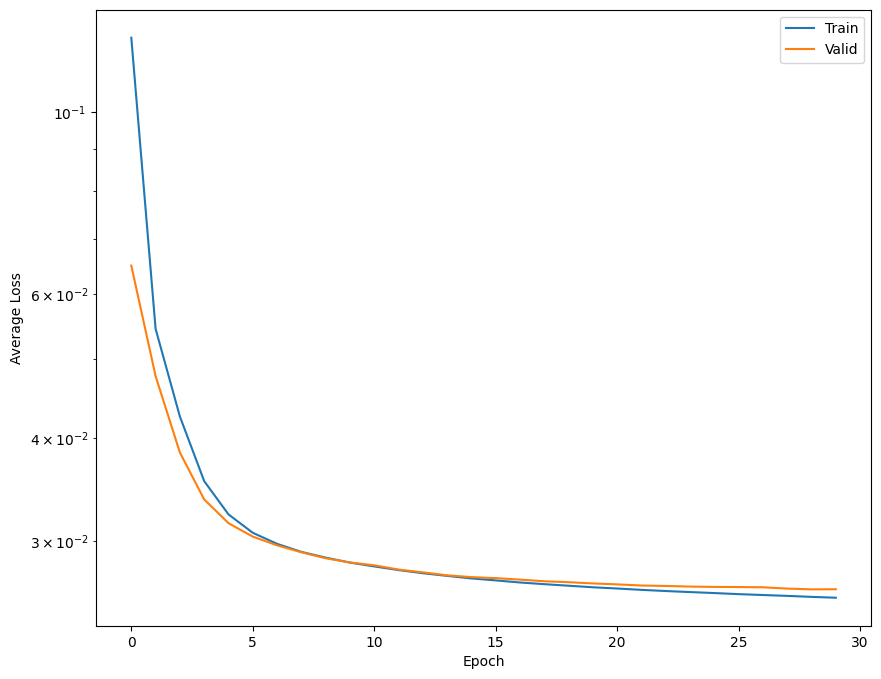

In [ ]:
# Plot losses
plt.figure(figsize=(10,8))
plt.semilogy(diz_loss['train_loss'], label='Train')
plt.semilogy(diz_loss['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
#plt.grid()
plt.legend()
#plt.title('loss')
plt.show()

tensor([-0.1292,  0.2249,  0.1503, -0.0729])
tensor([0.5000, 0.7088, 0.5655, 0.7111])


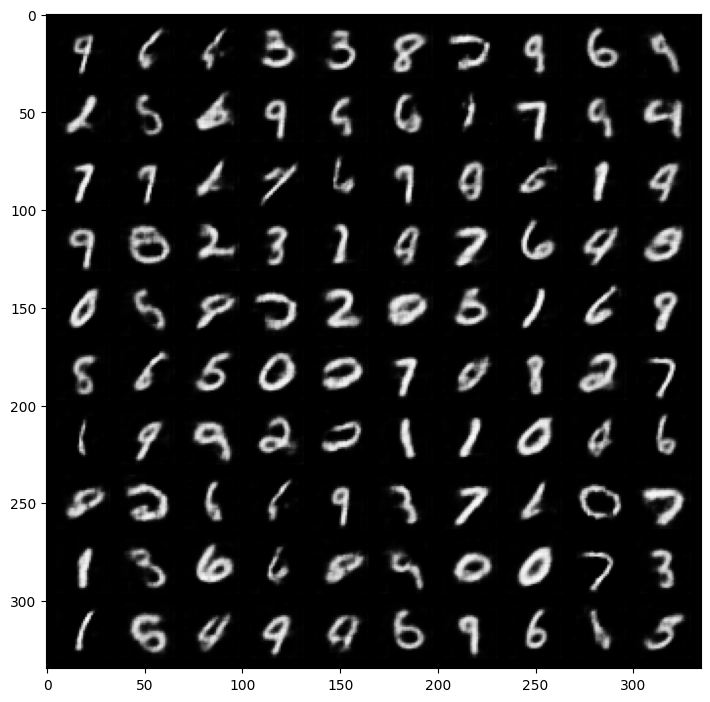

In [ ]:
def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

encoder.eval()
decoder.eval()

with torch.no_grad():
    # calculate mean and std of latent code, generated takining in test images as inputs

    images, labels = next(iter(test_loader))
    images = images.to(device)
    latent = encoder(images)
    latent = latent.cpu()

    mean = latent.mean(dim=0)
    print(mean)
    std = (latent - mean).pow(2).mean(dim=0).sqrt()
    std[0] = 0.5
    print(std)


    # sample latent vectors from the normal distribution
    latent = torch.randn(128, d)*std + mean

    # reconstruct images from the random latent vectors
    latent = latent.to(device)
    img_recon = decoder(latent)
    img_recon = img_recon.cpu()

    fig, ax = plt.subplots(figsize=(20, 8.5))
    show_image(torchvision.utils.make_grid(img_recon[:100],10,5))
    plt.show()

In [ ]:
from tqdm import tqdm
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

  0%|          | 0/10000 [00:00<?, ?it/s]

100%|██████████| 10000/10000 [00:07<00:00, 1296.20it/s]


,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,label
0,0.028490,0.817043,-0.273246,-2.293557,7
1,0.660544,0.385283,0.787260,0.088542,2
2,0.488024,1.547137,-0.423591,0.343802,1
3,-0.544744,-0.683144,0.356538,0.565767,0
4,-1.816473,0.396900,-0.239591,-0.021536,4
...,...,...,...,...,...
9995,1.015564,-0.210934,0.621483,-0.399119,2
9996,0.256455,0.064760,0.817236,0.067076,3
9997,-0.655805,0.518390,-0.779956,-0.132584,4
9998,0.134249,-0.307928,-0.269265,0.256565,5
